In [1]:
import os
import json
import zlib
import base64
import numpy as np
from PIL import Image
from io import BytesIO
from torch.utils.data import Dataset
import torchvision.transforms as T


class CIHPDataset(Dataset):
    def __init__(self, root_dir, target_classes=None, transform=None, target_size=(512, 512)):
        self.img_dir = os.path.join(root_dir, 'img')
        self.ann_dir = os.path.join(root_dir, 'ann')
        self.filenames = sorted(f for f in os.listdir(self.img_dir) if f.endswith('.jpg'))
        self.target_classes = target_classes or ['face', 'head']
        self.transform = transform
        self.target_size = target_size

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        filename = self.filenames[idx]
        image = Image.open(os.path.join(self.img_dir, filename)).convert('RGB')
        mask = self._load_mask_from_json(os.path.join(self.ann_dir, filename + '.json'), image.size)

        # Convert mask to np array
        mask = np.array(mask, dtype=np.int64)
        return image, mask


    def _load_mask_from_json(self, ann_path, image_size):
        width, height = image_size
        mask = Image.new('L', (width, height), 0)

        with open(ann_path, 'r') as f:
            data = json.load(f)

        for obj in data.get('objects', []):
            class_title = obj.get('classTitle', '').lower()
            if class_title not in self.target_classes:
                continue

            if obj.get('geometryType') != 'bitmap':
                continue

            bitmap = obj['bitmap']
            origin_x, origin_y = bitmap['origin']
            b64_data = bitmap['data']
            raw = zlib.decompress(base64.b64decode(b64_data))
            submask = Image.open(BytesIO(raw)).convert('L')

            # Paste submask into full image mask
            mask.paste(1, box=(origin_x, origin_y), mask=submask)

        return mask


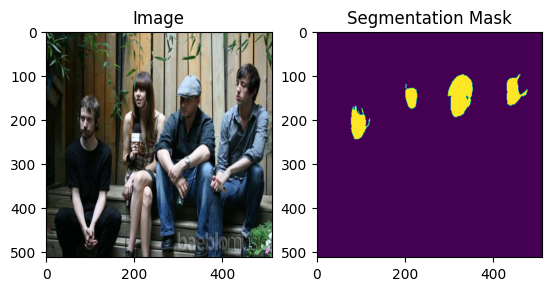

In [ ]:
dataset = CIHPDataset('C:/Users/alexi/OneDrive/Desktop/my_code_projects/headcounter data/training', target_classes=['face', 'hat', 'head'])
image, mask = dataset[1]

# Show it
import matplotlib.pyplot as plt
plt.subplot(1, 2, 1); plt.imshow(image.permute(1, 2, 0)); plt.title("Image")
plt.subplot(1, 2, 2); plt.imshow(mask); plt.title("Segmentation Mask")
plt.show()


In [2]:
import os
from PIL import Image, ImageDraw
import numpy as np
from tqdm import tqdm

def extract_head_crops(
    jhu_dir,
    out_dir,
    target_size=(512, 512),
    max_crops_per_image=5,
    total_crop_limit=5000,
    min_box_size=20,
    pad_ratio=0.5,
    show_samples=False
):
    os.makedirs(f"{out_dir}/img", exist_ok=True)
    os.makedirs(f"{out_dir}/mask", exist_ok=True)

    img_dir = os.path.join(jhu_dir, "train/images")
    gt_dir = os.path.join(jhu_dir, "train/gt")
    label_files = [f for f in os.listdir(gt_dir) if f.endswith(".txt")]

    total_crops = 0

    for fname in tqdm(label_files, desc="Extracting padded head crops"):
        if total_crops >= total_crop_limit:
            break

        img_id = os.path.splitext(fname)[0]
        img_path = os.path.join(img_dir, f"{img_id}.jpg")
        gt_path = os.path.join(gt_dir, fname)

        if not os.path.exists(img_path):
            continue

        try:
            with Image.open(img_path) as im:
                image = im.convert("RGB")
        except Exception as e:
            print(f"⚠️ Skipping {img_path}: {e}")
            continue

        w, h = image.size
        crop_count = 0

        try:
            with open(gt_path, "r") as f:
                for i, line in enumerate(f):
                    if total_crops >= total_crop_limit:
                        break

                    try:
                        x, y, bw, bh, cls, vis = map(int, line.strip().split())
                    except:
                        continue

                    if cls != 2 or vis != 1:
                        continue
                    if bw < min_box_size or bh < min_box_size:
                        continue

                    # Expand + pad
                    pad_x = int(bw * pad_ratio * 1.3)
                    pad_y = int(bh * pad_ratio * 1.3)

                    x0 = x - pad_x
                    y0 = y - pad_y
                    x1 = x + bw + pad_x
                    y1 = y + bh + pad_y

                    # Shift inward if out of bounds
                    shift_x = 0
                    shift_y = 0
                    if x0 < 0:
                        shift_x = -x0
                    if x1 > w:
                        shift_x = w - x1
                    if y0 < 0:
                        shift_y = -y0
                    if y1 > h:
                        shift_y = h - y1

                    x0 += shift_x
                    x1 += shift_x
                    y0 += shift_y
                    y1 += shift_y

                    # Final clamp
                    x0 = max(0, x0)
                    y0 = max(0, y0)
                    x1 = min(w, x1)
                    y1 = min(h, y1)

                    if x1 <= x0 or y1 <= y0:
                        continue

                    crop = image.crop((x0, y0, x1, y1)).resize(target_size, Image.BILINEAR)

                    # Dummy full-mask
                    mask = Image.new("L", target_size, 0)
                    draw = ImageDraw.Draw(mask)
                    draw.rectangle([0, 0, target_size[0]-1, target_size[1]-1], fill=1)

                    out_base = f"{img_id}_{i}"
                    crop.save(os.path.join(out_dir, "img", f"{out_base}.jpg"))
                    mask.save(os.path.join(out_dir, "mask", f"{out_base}.png"))

                    if show_samples and np.random.rand() < 0.01:
                        crop.show()
                        input("➡️ Next")

                    crop_count += 1
                    total_crops += 1
                    if crop_count >= max_crops_per_image:
                        break

        except Exception as e:
            print(f"⚠️ Problem parsing {gt_path}: {e}")

    print(f"✅ Finished: {total_crops} context-aware head crops extracted.")




extract_head_crops(
    jhu_dir="C:/Users/alexi/OneDrive/Desktop/my_code_projects/headcounter data/jhu_crowd_v2.0/jhu_crowd_v2.0",
    out_dir="C:/Users/alexi/OneDrive/Desktop/my_code_projects/headcounter data/cropped_jhu",
    target_size=(512, 512),
    max_crops_per_image=5,
    total_crop_limit=5000
)


Extracting padded head crops: 100%|██████████| 2272/2272 [00:44<00:00, 50.53it/s] 

✅ Finished: 247 context-aware head crops extracted.


In [16]:
import os
import json
import zlib
import base64
import numpy as np
from PIL import Image
from io import BytesIO
from torch.utils.data import Dataset
import torchvision.transforms as T
import torch
import torch.nn.functional as F


class CIHPDataset(Dataset):
    def __init__(self, root_dir, target_classes=None, transform=None, target_size=(512, 512)):
        self.img_dir = os.path.join(root_dir, 'img')
        self.ann_dir = os.path.join(root_dir, 'ann')
        self.filenames = sorted(f for f in os.listdir(self.img_dir) if f.endswith('.jpg'))
        self.target_classes = target_classes or ['face', 'head']
        self.transform = transform
        self.target_size = target_size

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        filename = self.filenames[idx]
        image = Image.open(os.path.join(self.img_dir, filename)).convert('RGB')
        mask = self._load_mask_from_json(os.path.join(self.ann_dir, filename + '.json'), image.size)

        # Convert mask to np array
        mask = np.array(mask, dtype=np.int64)
        return image, mask


    def _load_mask_from_json(self, ann_path, image_size):
        width, height = image_size
        mask = Image.new('L', (width, height), 0)

        with open(ann_path, 'r') as f:
            data = json.load(f)

        for obj in data.get('objects', []):
            class_title = obj.get('classTitle', '').lower()
            if class_title not in self.target_classes:
                continue

            if obj.get('geometryType') != 'bitmap':
                continue

            bitmap = obj['bitmap']
            origin_x, origin_y = bitmap['origin']
            b64_data = bitmap['data']
            raw = zlib.decompress(base64.b64decode(b64_data))
            submask = Image.open(BytesIO(raw)).convert('L')

            # Paste submask into full image mask
            mask.paste(1, box=(origin_x, origin_y), mask=submask)

        return mask

import os
from PIL import Image
import torch
from torch.utils.data import Dataset
import torchvision.transforms as T
import numpy as np

class CorruptedCIHPDataset(Dataset):
    def __init__(self, img_dir, mask_dir, target_size=(512, 512)):
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.target_size = target_size
        self.image_files = sorted([
            f for f in os.listdir(img_dir)
            if f.lower().endswith(('.jpg', '.png'))
        ])

        self.img_transform = T.Compose([
            T.Resize(target_size, interpolation=Image.BILINEAR),
            T.ToTensor()
        ])

        self.mask_transform = T.Compose([
            T.Resize(target_size, interpolation=Image.NEAREST),
            T.Lambda(lambda img: torch.from_numpy(np.array(img, dtype=np.int64)))
        ])

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        fname = self.image_files[idx]
        img_path = os.path.join(self.img_dir, fname)
        mask_path = os.path.join(self.mask_dir, fname.replace('.jpg', '.png'))

        try:
            mask = Image.open(mask_path)
            mask.load()
            mask = mask.convert("L")
        except Exception as e:
            raise RuntimeError(f"Error loading mask '{mask_path}': {e}")

        try:
            mask = Image.open(mask_path)
            mask.load()
            mask = mask.convert("L")
        except Exception as e:
            raise RuntimeError(f"Error loading mask '{mask_path}': {e}")


        return self.img_transform(image), self.mask_transform(mask)

from torch.utils.data import ConcatDataset

cihp_dataset = CIHPDataset(
    root_dir="C:/Users/alexi/OneDrive/Desktop/my_code_projects/headcounter data/training",
    target_classes=['face', 'hat', 'head'],
    target_size=(512, 512)
)

corrupted_dataset = CorruptedCIHPDataset(
    img_dir="C:/Users/alexi/OneDrive/Desktop/my_code_projects/headcounter data/training/corrupted",
    mask_dir="C:/Users/alexi/OneDrive/Desktop/my_code_projects/headcounter data/training/corrupted_mask",
    target_size=(512, 512)
)

combined_dataset = ConcatDataset([cihp_dataset, corrupted_dataset])

train_loader = torch.utils.data.DataLoader(
    combined_dataset,
    batch_size=4,
    shuffle=True,
    num_workers=4,
    pin_memory=True
)

In [17]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, SubsetRandomSampler, ConcatDataset
from tqdm import tqdm
import random
import numpy as np

from transformers import SegformerForSemanticSegmentation, SegformerConfig, SegformerImageProcessor
from torchvision import transforms as T

# === Your Dataset Classes (assumed already imported) ===
# - CIHPDataset
# - SegmentationFolderDataset
# - JHUFullImageMaskDataset

# --- Config ---
TARGET_CLASSES = ['face', 'hat']
NUM_CLASSES = len(TARGET_CLASSES) + 1  # +1 for background
IMG_SIZE = (512, 512)
BATCH_SIZE = 4
NUM_EPOCHS = 20
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# --- Datasets ---
full_dataset = combined_dataset
# --- Model ---
config = SegformerConfig(
    num_labels=NUM_CLASSES,
    id2label={i: name for i, name in enumerate(['background'] + TARGET_CLASSES)},
    label2id={name: i for i, name in enumerate(['background'] + TARGET_CLASSES)}
)
model = SegformerForSemanticSegmentation(config).to(DEVICE)

# --- Image Processor ---
processor = SegformerImageProcessor(do_resize=True, size=IMG_SIZE, reduce_labels=False)

# --- Loss + Optimizer ---
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=1e-4)

# --- Training Loop ---
for epoch in range(NUM_EPOCHS):
    subset_size = 500
    indices = random.sample(range(len(full_dataset)), subset_size)
    sampler = SubsetRandomSampler(indices)
    train_loader = DataLoader(full_dataset, batch_size=BATCH_SIZE, sampler=sampler, num_workers=0)

    model.train()
    running_loss = 0.0

    for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS}"):
        pixel_values = []
        labels = []

        for img, mask in zip(images, masks):
            processed = processor(images=img, segmentation_maps=mask, return_tensors="pt")
            pixel_values.append(processed['pixel_values'][0])
            labels.append(processed['labels'][0])

        pixel_values = torch.stack(pixel_values).to(DEVICE)
        labels = torch.stack(labels).to(DEVICE)

        outputs = model(pixel_values)
        loss = criterion(outputs.logits, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    avg_loss = running_loss / len(train_loader)
    print(f"Epoch {epoch+1}, Loss: {avg_loss:.4f}")

# --- Save ---
torch.save(model.state_dict(), "segformer_cihp_combined.pth")
print("✅ Training complete. Model saved.")


Epoch 1/20:   0%|          | 0/125 [00:00<?, ?it/s]


AttributeError: property 'mode' of 'JpegImageFile' object has no setter

In [19]:
# cihp_training_pipeline.py
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, SubsetRandomSampler
from torchvision import models
import torchvision.transforms as T
from tqdm import tqdm
import random

# --- Config ---
ROOT_DIR = 'C:/Users/alexi/OneDrive/Desktop/my_code_projects/headcounter data/training'
TARGET_CLASSES = ['face', 'hat']
NUM_CLASSES = len(TARGET_CLASSES) + 1
BATCH_SIZE = 4
NUM_EPOCHS = 20
IMG_SIZE = (512, 512)
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# --- Dataset ---
train_dataset = CIHPDataset(
    root_dir=ROOT_DIR,
    target_classes=TARGET_CLASSES,
    target_size=IMG_SIZE
)

# --- Model ---
model = models.segmentation.deeplabv3_mobilenet_v3_large(pretrained=False)
model.classifier[4] = nn.Conv2d(256, NUM_CLASSES, kernel_size=1)
model = model.to(DEVICE)

# --- Loss + Optimizer ---
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=1e-4)

# --- Training Loop ---
for epoch in range(NUM_EPOCHS):
    # Create a new random subset of 125 unique samples each epoch
    subset_size = 500
    indices = random.sample(range(len(train_dataset)), subset_size)
    sampler = SubsetRandomSampler(indices)
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, sampler=sampler, num_workers=0)

    model.train()
    running_loss = 0.0
    for images, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS}"):
        images = images.to(DEVICE)
        masks = masks.to(DEVICE)

        optimizer.zero_grad()
        outputs = model(images)['out']
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    avg_loss = running_loss / len(train_loader)
    print(f"Epoch {epoch+1}, Loss: {avg_loss:.4f}")

# --- Save Model ---
torch.save(model.state_dict(), 'deeplabv3_cihp_2.pth')
print("Training complete. Model saved.")


C:\Users\alexi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\alexi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
Epoch 1/20:   0%|          | 0/125 [00:00<?, ?it/s]


AttributeError: property 'mode' of 'JpegImageFile' object has no setter

In [7]:
# cihp_training_pipeline.py
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import models
import torchvision.transforms as T
from tqdm import tqdm
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor
from PIL import Image
import numpy as np
from torch.optim.lr_scheduler import StepLR

# Decay LR by 0.1 every 10 epochs


# --- Config ---
ROOT_DIR = 'C:/Users/alexi/OneDrive/Desktop/my_code_projects/headcounter data/training'  # 'validation' or 'testing' for val/test
TARGET_CLASSES = ['face', 'hat']  # define classes you care about
NUM_CLASSES = len(TARGET_CLASSES) + 1  # +1 for background
BATCH_SIZE = 4
NUM_EPOCHS = 20
IMG_SIZE = (512, 512)
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
from torch.utils.data import Subset
import random


# --- Dataset ---
train_dataset = CIHPDataset(
    root_dir=ROOT_DIR,
    target_classes=TARGET_CLASSES,
    target_size=IMG_SIZE
)
subset_size = 500
indices = random.sample(range(len(train_dataset)), subset_size)
train_subset = Subset(train_dataset, indices)

train_loader = DataLoader(train_subset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0, collate_fn=lambda x: x)


# --- Hugging Face Setup ---
MODEL_NAME = "nvidia/segformer-b0-finetuned-ade-512-512"
image_processor = SegformerImageProcessor(do_resize=True, size=IMG_SIZE, reduce_labels=False)

model = SegformerForSemanticSegmentation.from_pretrained(
    "nvidia/segformer-b0-finetuned-ade-512-512",
    num_labels=3,
    id2label={0: "background", 1: "face", 2: "hat"},
    label2id={"background": 0, "face": 1, "hat": 2},
    ignore_mismatched_sizes=True  # <-- allow replacing the final layer
)


model = model.to(DEVICE)


# --- Loss + Optimizer ---
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=1e-4)
scheduler = StepLR(optimizer, step_size=10, gamma=0.1)

# --- Training Loop ---
for epoch in range(NUM_EPOCHS):
    model.train()
    running_loss = 0.0
    for batch in tqdm(train_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS}"):
        images, masks = zip(*batch)  # unzip the list of (image, mask) tuples


        pixel_values = []
        labels = []

        for img, mask in zip(images, masks):
            processed = image_processor(images=img, segmentation_maps=mask, return_tensors="pt")
            pixel_values.append(processed["pixel_values"])
            labels.append(processed["labels"])

        pixel_values = torch.cat(pixel_values).to(DEVICE)
        labels = torch.cat(labels).to(DEVICE)

        optimizer.zero_grad()
        outputs = model(pixel_values, labels=labels)
        loss = outputs.loss
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
    scheduler.step()
    avg_loss = running_loss / len(train_loader)
    print(f"Epoch {epoch+1}, Loss: {avg_loss:.4f}")


# --- Save Model ---
torch.save(model.state_dict(), 'segformer_cihp.pth')
print("Training complete. Model saved.")


Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([3]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([3, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Epoch 1/20: 100%|██████████| 125/125 [00:41<00:00,  3.02it/s]


Epoch 1, Loss: 0.4919


Epoch 2/20: 100%|██████████| 125/125 [00:33<00:00,  3.70it/s]


Epoch 2, Loss: 0.1560


Epoch 3/20: 100%|██████████| 125/125 [00:31<00:00,  3.97it/s]


Epoch 3, Loss: 0.0973


Epoch 4/20: 100%|██████████| 125/125 [00:33<00:00,  3.73it/s]


Epoch 4, Loss: 0.0701


Epoch 5/20: 100%|██████████| 125/125 [00:33<00:00,  3.77it/s]


Epoch 5, Loss: 0.0566


Epoch 6/20: 100%|██████████| 125/125 [00:39<00:00,  3.19it/s]


Epoch 6, Loss: 0.0494


Epoch 7/20: 100%|██████████| 125/125 [00:38<00:00,  3.28it/s]


Epoch 7, Loss: 0.0436


Epoch 8/20: 100%|██████████| 125/125 [00:31<00:00,  3.91it/s]


Epoch 8, Loss: 0.0407


Epoch 9/20: 100%|██████████| 125/125 [00:30<00:00,  4.15it/s]


Epoch 9, Loss: 0.0367


Epoch 10/20: 100%|██████████| 125/125 [00:29<00:00,  4.21it/s]


Epoch 10, Loss: 0.0383


Epoch 11/20: 100%|██████████| 125/125 [00:30<00:00,  4.16it/s]


Epoch 11, Loss: 0.0387


Epoch 12/20: 100%|██████████| 125/125 [00:29<00:00,  4.25it/s]


Epoch 12, Loss: 0.0327


Epoch 13/20: 100%|██████████| 125/125 [00:29<00:00,  4.20it/s]


Epoch 13, Loss: 0.0311


Epoch 14/20: 100%|██████████| 125/125 [00:30<00:00,  4.17it/s]


Epoch 14, Loss: 0.0304


Epoch 15/20: 100%|██████████| 125/125 [00:26<00:00,  4.66it/s]


Epoch 15, Loss: 0.0306


Epoch 16/20: 100%|██████████| 125/125 [00:28<00:00,  4.46it/s]


Epoch 16, Loss: 0.0290


Epoch 17/20: 100%|██████████| 125/125 [00:28<00:00,  4.42it/s]


Epoch 17, Loss: 0.0286


Epoch 18/20: 100%|██████████| 125/125 [00:29<00:00,  4.30it/s]


Epoch 18, Loss: 0.0280


Epoch 19/20: 100%|██████████| 125/125 [00:29<00:00,  4.26it/s]


Epoch 19, Loss: 0.0278


Epoch 20/20: 100%|██████████| 125/125 [00:28<00:00,  4.34it/s]

Epoch 20, Loss: 0.0270
Training complete. Model saved.


In [38]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("permanalwep/crowdhuman-crowd-detection")

print("Path to dataset files:", path)

100%|██████████| 830M/830M [00:10<00:00, 80.3MB/s] 

Extracting files...


Path to dataset files: C:\Users\alexi\.cache\kagglehub\datasets\permanalwep\crowdhuman-crowd-detection\versions\5


In [14]:
import cv2
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor
from torchvision import models
import torch.nn as nn
from torch.utils.data import DataLoader, Subset
import random

def evaluate_instance_recovery(model, dataloader, processor, face_class=1):
    model.eval()
    total_gt_faces = 0
    total_pred_faces = 0

    with torch.no_grad():
        for batch in dataloader:
            images, masks = zip(*batch)

            for img, mask in zip(images, masks):
                processed = processor(images=img, segmentation_maps=mask, return_tensors="pt")
                pixel_values = processed["pixel_values"].to(DEVICE)
                true_mask = np.array(mask)

                outputs = model(pixel_values)
                # Try DeepLabV3 key first, fallback to .logits
                if hasattr(outputs, 'logits'):
                    logits = outputs.logits  # SegFormer
                else:
                    logits = outputs['out']  # DeepLabV3


                pred_mask = torch.argmax(logits, dim=1).squeeze(0).cpu().numpy()

                gt_instances = cv2.connectedComponents((true_mask == face_class).astype(np.uint8))[0] - 1
                pred_instances = cv2.connectedComponents((pred_mask == face_class).astype(np.uint8))[0] - 1

                total_gt_faces += gt_instances
                total_pred_faces += pred_instances

    return total_pred_faces, total_gt_faces



deeplab = models.segmentation.deeplabv3_mobilenet_v3_large(pretrained=False)
deeplab.classifier[4] = nn.Conv2d(256, 3, kernel_size=1)  # 3 = background, face, hat
deeplab.load_state_dict(torch.load("deeplabv3_cihp_2.pth", map_location=DEVICE))
deeplab = deeplab.to(DEVICE)



from transformers import SegformerForSemanticSegmentation, SegformerConfig

# Rebuild config manually
config = SegformerConfig(
    num_labels=3,
    id2label={0: "background", 1: "face", 2: "hat"},
    label2id={"background": 0, "face": 1, "hat": 2}
)

# Initialize model with matching config
segformer = SegformerForSemanticSegmentation(config)
segformer.load_state_dict(torch.load("segformer_cihp.pth", map_location=DEVICE))
segformer = segformer.to(DEVICE)


image_processor = SegformerImageProcessor(do_resize=True, size=IMG_SIZE, reduce_labels=False)

dataset = CIHPDataset('C:/Users/alexi/OneDrive/Desktop/my_code_projects/headcounter data/training', target_classes=['face', 'hat', 'head'])
subset = Subset(dataset, random.sample(range(len(dataset)), 100))

val_loader = DataLoader(subset, batch_size=1, shuffle=False, num_workers=0, collate_fn=lambda x: x)

pred_deeplab, gt_deeplab = evaluate_instance_recovery(deeplab, val_loader, image_processor, face_class=1)
pred_segformer, gt_segformer = evaluate_instance_recovery(segformer, val_loader, image_processor, face_class=1)

print(f"DeepLabV3+: Predicted {pred_deeplab} vs GT {gt_deeplab}")
print(f"SegFormer  : Predicted {pred_segformer} vs GT {gt_segformer}")



C:\Users\alexi\AppData\Local\Temp\ipykernel_26044\2407059050.py:44: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  deeplab.load_state_dict(torch.load("deeplabv3_cihp_2.pth", 

DeepLabV3+: Predicted 54 vs GT 315
SegFormer  : Predicted 293 vs GT 315


In [24]:
import numpy as np
import torch
import cv2
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor
from torchvision import models
import torch.nn as nn
from torch.utils.data import DataLoader, Subset
import random
from transformers import SegformerForSemanticSegmentation, SegformerConfig

def evaluate_segmentation_metrics(model, dataloader, processor, face_class=1):
    model.eval()

    total_iou = 0.0
    total_dice = 0.0
    total_images = 0

    total_gt_faces = 0
    total_pred_faces = 0

    total_tp = 0
    total_fp = 0
    total_fn = 0

    with torch.no_grad():
        for batch in dataloader:
            images, masks = zip(*batch)

            for img, mask in zip(images, masks):
                processed = processor(images=img, segmentation_maps=mask, return_tensors="pt")
                pixel_values = processed["pixel_values"].to(DEVICE)
                true_mask = np.array(mask)

                outputs = model(pixel_values)
                logits = outputs.logits if hasattr(outputs, 'logits') else outputs['out']

                # Resize prediction to match true_mask
                logits_resized = torch.nn.functional.interpolate(
                    logits, size=true_mask.shape, mode='bilinear', align_corners=False
                )
                pred_mask = torch.argmax(logits_resized, dim=1).squeeze(0).cpu().numpy()


                # === Instance Count ===
                gt_instances = cv2.connectedComponents((true_mask == face_class).astype(np.uint8))[0] - 1
                pred_instances = cv2.connectedComponents((pred_mask == face_class).astype(np.uint8))[0] - 1
                total_gt_faces += gt_instances
                total_pred_faces += pred_instances

                # === IoU / Dice ===
                pred_bin = (pred_mask == face_class).astype(np.uint8)
                true_bin = (true_mask == face_class).astype(np.uint8)

                intersection = np.logical_and(pred_bin, true_bin).sum()
                union = np.logical_or(pred_bin, true_bin).sum()
                iou = intersection / union if union != 0 else 0.0

                dice = 2 * intersection / (pred_bin.sum() + true_bin.sum() + 1e-8)

                total_iou += iou
                total_dice += dice

                # === Precision / Recall ===
                tp = intersection
                fp = pred_bin.sum() - tp
                fn = true_bin.sum() - tp

                total_tp += tp
                total_fp += fp
                total_fn += fn

                total_images += 1

    avg_iou = total_iou / total_images
    avg_dice = total_dice / total_images

    precision = total_tp / (total_tp + total_fp + 1e-8)
    recall = total_tp / (total_tp + total_fn + 1e-8)
    f1 = 2 * precision * recall / (precision + recall + 1e-8)

    return {
        "IoU": avg_iou,
        "Dice": avg_dice,
        "Precision": precision,
        "Recall": recall,
        "F1": f1,
        "GT Instances": total_gt_faces,
        "Pred Instances": total_pred_faces
    }


deeplab = models.segmentation.deeplabv3_mobilenet_v3_large(pretrained=False)
deeplab.classifier[4] = nn.Conv2d(256, 3, kernel_size=1)  # 3 = background, face, hat
deeplab.load_state_dict(torch.load("deeplabv3_cihp_2.pth", map_location=DEVICE))
deeplab = deeplab.to(DEVICE)

# Rebuild config manually
config = SegformerConfig(
    num_labels=3,
    id2label={0: "background", 1: "face", 2: "hat"},
    label2id={"background": 0, "face": 1, "hat": 2}
)

# Initialize model with matching config
segformer = SegformerForSemanticSegmentation(config)
segformer.load_state_dict(torch.load("segformer_cihp.pth", map_location=DEVICE))
segformer = segformer.to(DEVICE)


image_processor = SegformerImageProcessor(do_resize=True, size=IMG_SIZE, reduce_labels=False)

dataset = CIHPDataset('C:/Users/alexi/OneDrive/Desktop/my_code_projects/headcounter data/training', target_classes=['face', 'hat', 'head'])
subset = Subset(dataset, random.sample(range(len(dataset)), 100))

val_loader = DataLoader(subset, batch_size=1, shuffle=False, num_workers=0, collate_fn=lambda x: x)
metrics_deeplab = evaluate_segmentation_metrics(deeplab, val_loader, image_processor, face_class=1)
metrics_segformer = evaluate_segmentation_metrics(segformer, val_loader, image_processor, face_class=1)

print("\n--- DeepLabV3+ ---")
for k, v in metrics_deeplab.items():
    print(f"{k}: {v:.3f}" if isinstance(v, float) else f"{k}: {v}")

print("\n--- SegFormer ---")
for k, v in metrics_segformer.items():
    print(f"{k}: {v:.3f}" if isinstance(v, float) else f"{k}: {v}")


C:\Users\alexi\AppData\Local\Temp\ipykernel_26044\1359770838.py:94: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  deeplab.load_state_dict(torch.load("deeplabv3_cihp_2.pth", 


--- DeepLabV3+ ---
IoU: 0.003
Dice: 0.005
Precision: 0.088
Recall: 0.005
F1: 0.010
GT Instances: 358
Pred Instances: 57

--- SegFormer ---
IoU: 0.630
Dice: 0.744
Precision: 0.855
Recall: 0.791
F1: 0.822
GT Instances: 358
Pred Instances: 345


C:\Users\alexi\AppData\Local\Temp\ipykernel_26044\3236176547.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(path, map_location=DEVICE)

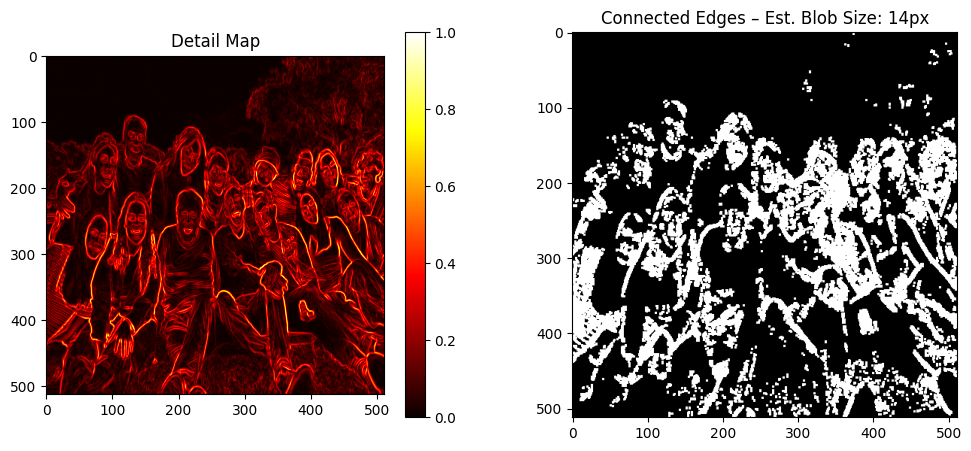

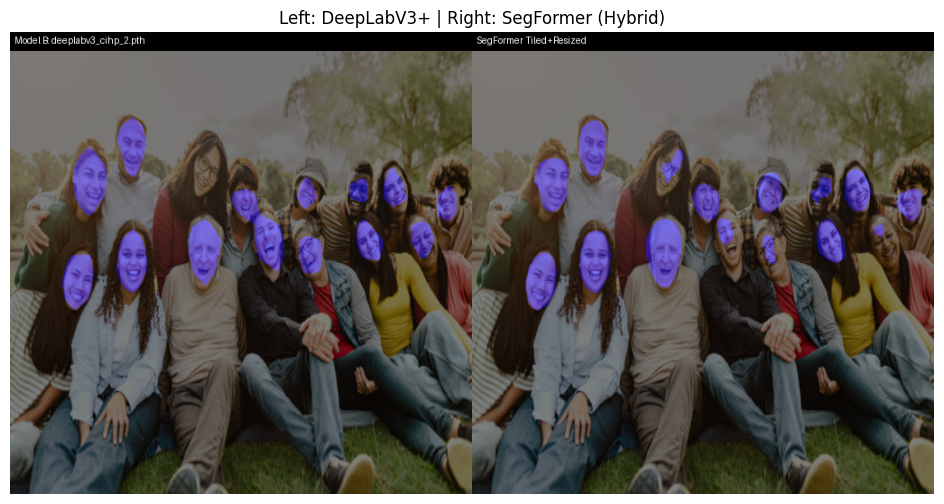

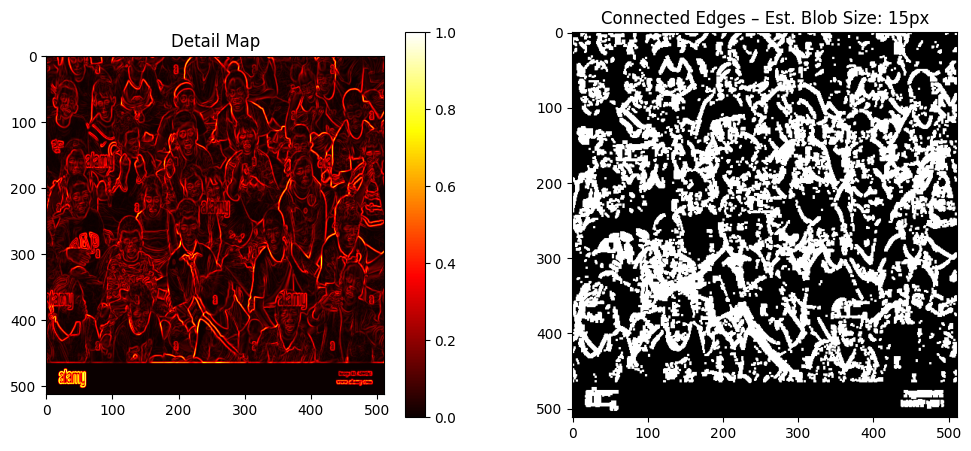

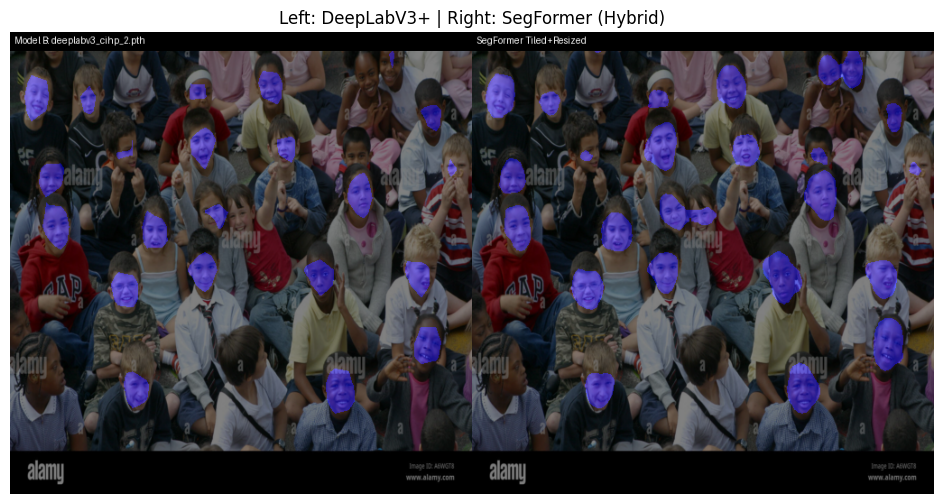

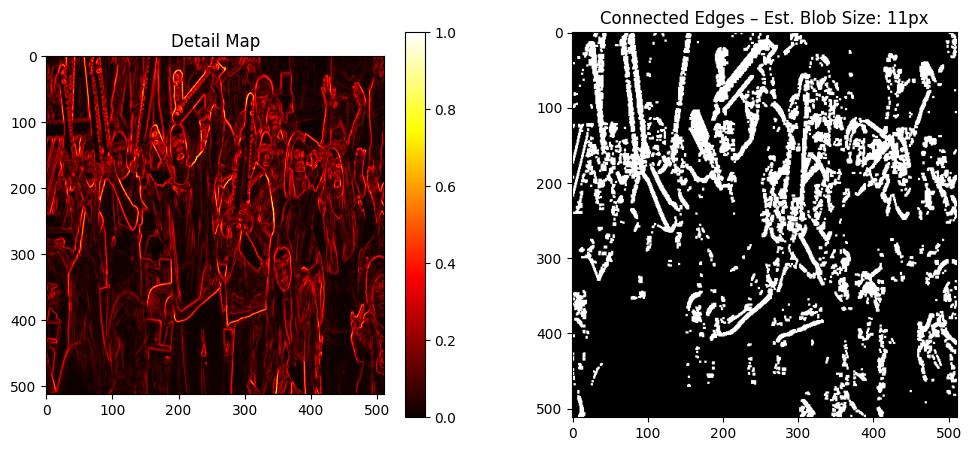

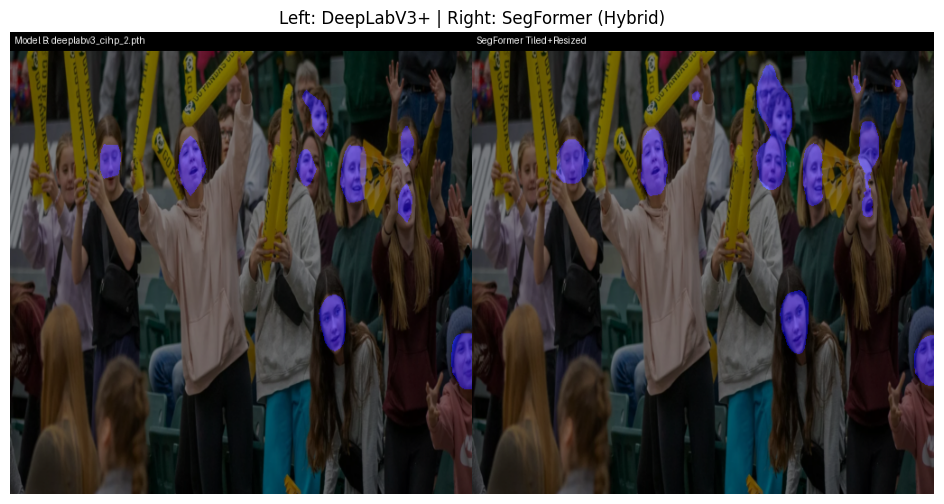

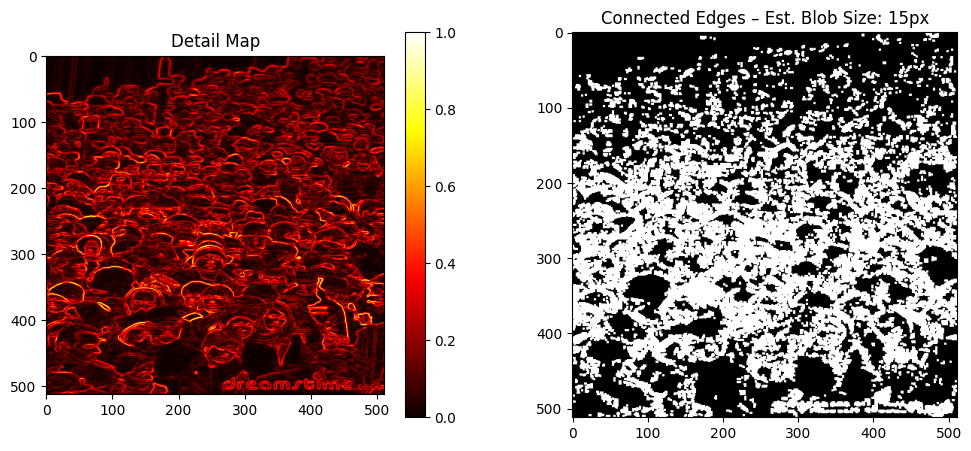

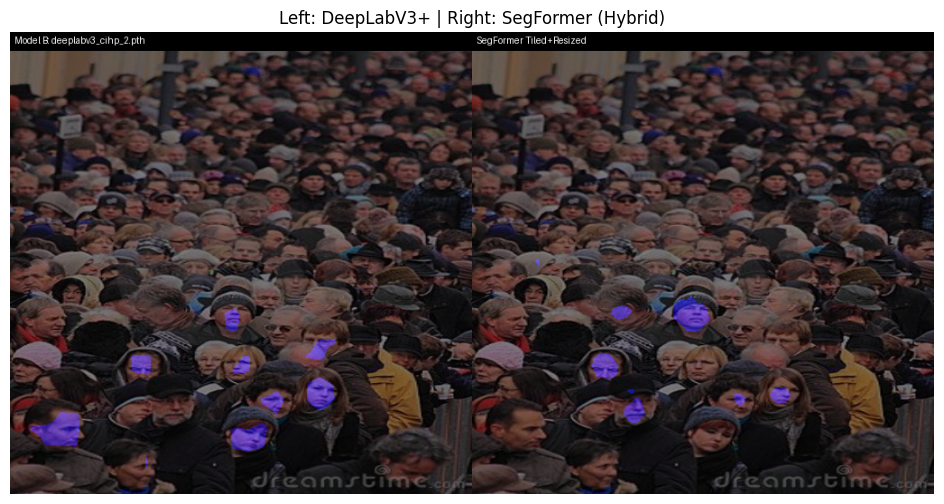

In [36]:
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor
import torchvision.transforms as T
import cv2
import numpy as np
import torch
from torchvision import models
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import torch.nn.functional as F

# --- Config ---
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
NUM_CLASSES = 3
IMG_SIZE = (512, 512)
FACE_CLASS = 1
ALPHA = 0.5

# --- Load Model B ---
def load_model(path):
    model = models.segmentation.deeplabv3_mobilenet_v3_large(pretrained=False)
    model.classifier[4] = torch.nn.Conv2d(256, NUM_CLASSES, kernel_size=1)
    model.load_state_dict(torch.load(path, map_location=DEVICE))
    model.to(DEVICE).eval()
    return model

model_B = load_model('deeplabv3_cihp_2.pth')

# --- Preprocess ---
def preprocess_image(img_path):
    image = Image.open(img_path).convert('RGB')
    image_resized = image.resize(IMG_SIZE, Image.BILINEAR)
    tensor = T.ToTensor()(image_resized).unsqueeze(0).to(DEVICE)
    return tensor, IMG_SIZE, np.array(image_resized)  # return resized image for overlay


# --- Predict ---
def predict_mask(model, tensor, original_size):
    with torch.no_grad():
        out = model(tensor)['out']
        logits = F.interpolate(out, size=original_size[::-1], mode='bilinear', align_corners=False)
        predicted = torch.argmax(logits, dim=1).squeeze(0).cpu().numpy()
    return predicted

# --- Overlay mask with 50% alpha ---
def overlay_mask(image_np, mask, face_class=FACE_CLASS, color=(0, 0, 255)):
    mask_bool = (mask == face_class)
    mask_rgb = np.zeros_like(image_np)
    mask_rgb[mask_bool] = color
    overlay = cv2.addWeighted(image_np, 1 - ALPHA, mask_rgb, ALPHA, 0)
    return overlay

# --- Draw caption ---
def draw_caption(img_np, text):
    img = Image.fromarray(img_np)
    draw = ImageDraw.Draw(img)
    font = ImageFont.load_default()
    draw.rectangle([0, 0, img.size[0], 20], fill=(0, 0, 0, 128))
    draw.text((5, 3), text, fill=(255, 255, 255), font=font)
    return np.array(img)

# --- Load SegFormer ---
processor = SegformerImageProcessor(do_resize=True, size=IMG_SIZE, reduce_labels=False)
config = SegformerConfig(
    num_labels=3,
    id2label={0: "background", 1: "face", 2: "hat"},
    label2id={"background": 0, "face": 1, "hat": 2}
)

# Initialize model with matching config
segformer = SegformerForSemanticSegmentation(config)
segformer.load_state_dict(torch.load("segformer_cihp.pth", map_location=DEVICE))
segformer = segformer.to(DEVICE)

# --- Predict with SegFormer ---
def predict_mask_segformer(model, processor, image_pil):
    original_size = image_pil.size  # (width, height)
    inputs = processor(images=image_pil, return_tensors="pt").to(DEVICE)
    
    with torch.no_grad():
        outputs = model(**inputs)
    
    logits = outputs.logits  # shape: [1, C, H, W]
    
    # Resize prediction back to original resolution
    upsampled_logits = F.interpolate(logits, size=original_size[::-1], mode='bilinear', align_corners=False)
    pred_mask = torch.argmax(upsampled_logits, dim=1).squeeze(0).cpu().numpy()
    return pred_mask

# --- Predict with SegFormer + Tiling ---
def predict_mask_segformer_with_tiles(model, processor, image_pil, tile_size=(512, 512), stride=256, class_id=1):
    w, h = image_pil.size
    full_mask = np.zeros((h, w), dtype=np.uint8)

    # Full resized prediction
    full_inputs = processor(images=image_pil, return_tensors="pt").to(DEVICE)
    with torch.no_grad():
        full_logits = model(**full_inputs).logits
    full_logits_upsampled = F.interpolate(full_logits, size=(h, w), mode="bilinear", align_corners=False)
    full_pred = torch.argmax(full_logits_upsampled, dim=1).squeeze(0).cpu().numpy()

    # Sliding window prediction
    image_np = np.array(image_pil)
    tile_mask = np.zeros((h, w), dtype=np.uint8)

    for y in range(0, h - tile_size[1] + 1, stride):
        for x in range(0, w - tile_size[0] + 1, stride):
            crop = image_pil.crop((x, y, x + tile_size[0], y + tile_size[1]))
            inputs = processor(images=crop, return_tensors="pt").to(DEVICE)

            with torch.no_grad():
                outputs = model(**inputs).logits

            # Upsample tile logits to tile size
            upsampled_logits = F.interpolate(outputs, size=tile_size, mode="bilinear", align_corners=False)
            pred = torch.argmax(upsampled_logits, dim=1).squeeze(0).cpu().numpy()

            tile_mask[y:y + tile_size[1], x:x + tile_size[0]] = np.maximum(tile_mask[y:y + tile_size[1], x:x + tile_size[0]], pred)

    # Union of tiled + full resized mask
    union_mask = np.where((full_pred == class_id) | (tile_mask == class_id), class_id, 0).astype(np.uint8)
    return union_mask


def preprocess_resized_image(img_path):
    image = Image.open(img_path).convert("RGB")
    image_resized = image.resize(IMG_SIZE, Image.BILINEAR)
    return image_resized, np.array(image_resized)

def predict_mask_segformer_with_tiles(
    model,
    processor,
    image_pil,
    tile_size=(512, 512),
    stride=256,
    detail_stride=128,
    detail_threshold=0.3,
    class_id=1
):
    w, h = image_pil.size
    image_np = np.array(image_pil)

    # === 1. Estimate Blob Size from Edge Map ===
    def estimate_average_blob_size(image_np):
        gray = cv2.cvtColor(image_np, cv2.COLOR_RGB2GRAY)
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 1, ksize=3)
        edges = np.uint8(np.abs(sobel) > 30)
        kernel = np.ones((3, 3), np.uint8)
        dilated = cv2.dilate(edges, kernel, iterations=1)
        num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(dilated)
        areas = stats[1:, cv2.CC_STAT_AREA]
        if len(areas) == 0:
            return 64
        avg_area = np.mean(areas)
        est_size = int(np.sqrt(avg_area))
        return est_size, dilated

    blob_size, dilated = estimate_average_blob_size(image_np)
    detail_tile_size = max(64, min(512, 4 * blob_size))

    # === 2. Full Image Segmentation ===
    full_inputs = processor(images=image_pil, return_tensors="pt").to(DEVICE)
    with torch.no_grad():
        full_logits = model(**full_inputs).logits
    full_pred = torch.argmax(
        F.interpolate(full_logits, size=(h, w), mode="bilinear", align_corners=False),
        dim=1
    ).squeeze(0).cpu().numpy()

    # === 3. Sliding Window Segmentation ===
    tile_mask = np.zeros((h, w), dtype=np.uint8)
    for y in range(0, h - tile_size[1] + 1, stride):
        for x in range(0, w - tile_size[0] + 1, stride):
            crop = image_pil.crop((x, y, x + tile_size[0], y + tile_size[1]))
            inputs = processor(images=crop, return_tensors="pt").to(DEVICE)
            with torch.no_grad():
                outputs = model(**inputs).logits
            pred = torch.argmax(
                F.interpolate(outputs, size=tile_size, mode="bilinear", align_corners=False),
                dim=1
            ).squeeze(0).cpu().numpy()
            tile_mask[y:y + tile_size[1], x:x + tile_size[0]] = np.maximum(
                tile_mask[y:y + tile_size[1], x:x + tile_size[0]],
                pred
            )

    # === 4. Compute Detail Map ===
    def compute_detail_map(image_np):
        gray = cv2.cvtColor(image_np, cv2.COLOR_RGB2GRAY)
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
        grad_mag = np.sqrt(sobelx ** 2 + sobely ** 2)
        return grad_mag / grad_mag.max()

    detail_map = compute_detail_map(image_np)

    # === 5. Select High-Detail Tiles ===
    def get_high_detail_tiles(detail_map):
        tiles = []
        for y in range(0, h - detail_tile_size + 1, detail_stride):
            for x in range(0, w - detail_tile_size + 1, detail_stride):
                tile = detail_map[y:y + detail_tile_size, x:x + detail_tile_size]
                if tile.mean() > detail_threshold:
                    tiles.append((x, y, detail_tile_size, detail_tile_size))
        return tiles

    high_detail_tiles = get_high_detail_tiles(detail_map)

    # === 6. Adaptive Mask Pass ===
    adaptive_mask = np.zeros((h, w), dtype=np.uint8)
    for x, y, tw, th in high_detail_tiles:
        crop = image_pil.crop((x, y, x + tw, y + th)).resize((512, 512), Image.BILINEAR)
        inputs = processor(images=crop, return_tensors="pt").to(DEVICE)
        with torch.no_grad():
            outputs = model(**inputs).logits
        pred = torch.argmax(outputs, dim=1).squeeze(0).cpu().numpy()
        pred_resized = cv2.resize(pred.astype(np.uint8), (tw, th), interpolation=cv2.INTER_NEAREST)
        adaptive_mask[y:y + th, x:x + tw] = np.maximum(adaptive_mask[y:y + th, x:y + th], pred_resized)

    # === 7. Merge Masks ===
    final_mask = np.where(
        (full_pred == class_id) | (tile_mask == class_id) | (adaptive_mask == class_id),
        class_id,
        0
    ).astype(np.uint8)

    # === 8. Optional Debug Plots ===
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(detail_map, cmap='hot')
    plt.title("Detail Map")
    plt.colorbar()
    plt.subplot(1, 2, 2)
    plt.imshow(dilated, cmap='gray')
    plt.title(f"Connected Edges – Est. Blob Size: {blob_size}px")
    plt.show()

    return final_mask


# --- Combined display ---
def show_both_models_output(img_path):
    tensor, original_size, orig_image = preprocess_image(img_path)
    image_pil, orig_image = preprocess_resized_image(img_path)

    # --- DeepLab ---
    mask_B = predict_mask(model_B, tensor, original_size)
    overlay_B = overlay_mask(orig_image, mask_B)
    overlay_B = draw_caption(overlay_B, "Model B: deeplabv3_cihp_2.pth")

    # --- SegFormer (tiled + resized union) ---
    mask_S = predict_mask_segformer_with_tiles(segformer, processor, image_pil)
    overlay_S = overlay_mask(orig_image, mask_S)
    overlay_S = draw_caption(overlay_S, "SegFormer Tiled+Resized")

    # Combine and display
    combined = np.hstack((overlay_B, overlay_S))
    plt.figure(figsize=(14, 6))
    plt.imshow(combined)
    plt.axis("off")
    plt.title("Left: DeepLabV3+ | Right: SegFormer (Hybrid)")
    plt.show()

# --- Run on image paths ---
image_paths = [
    'istockphoto-1480574526-612x612.jpg',
    'crowd-of-primary-school-children-in-the-school-playground-A6WGT8.jpg',
    'convert.webp',
    'cd097ca3e6a09fa9d231f10b549d14b9.jpg'
]

for path in image_paths:
    show_both_models_output(path)



C:\Users\alexi\AppData\Local\Temp\ipykernel_26044\3129014326.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(path, map_location=DEVICE)

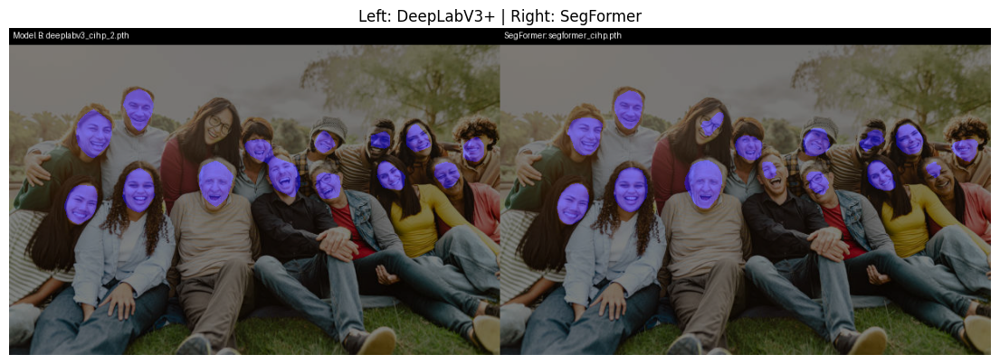

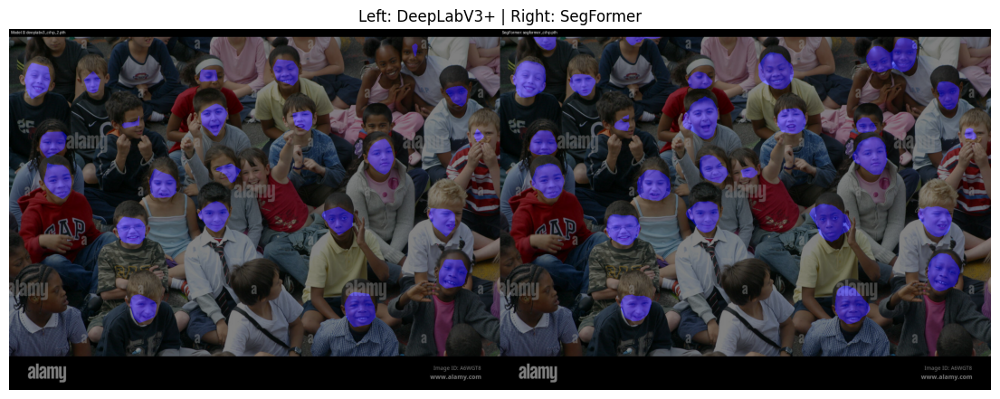

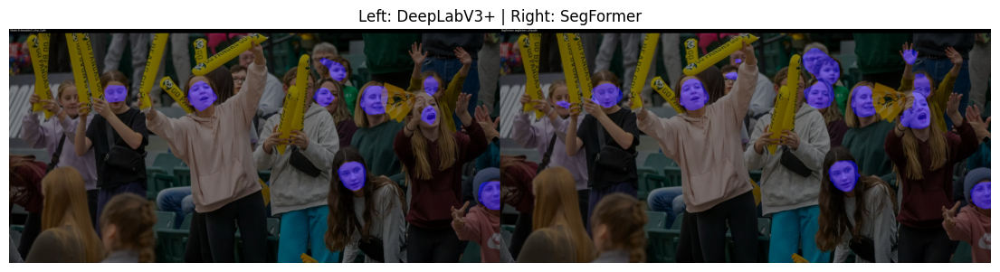

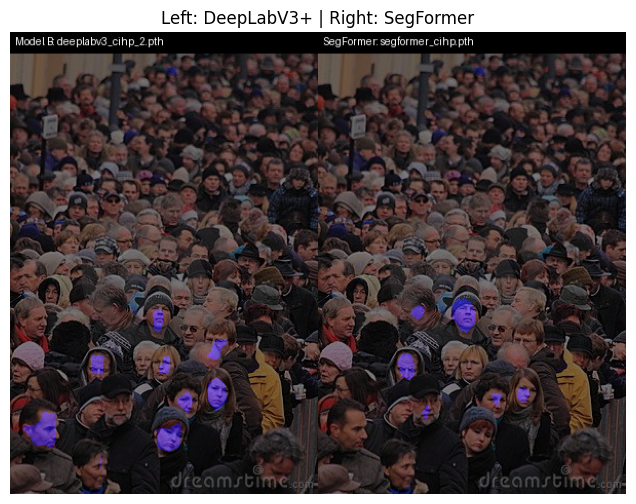

In [ ]:
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor
import torchvision.transforms as T
import cv2
import numpy as np
import torch
from torchvision import models
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import torch.nn.functional as F

# --- Config ---
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
NUM_CLASSES = 3
IMG_SIZE = (512, 512)
FACE_CLASS = 1
ALPHA = 0.5

# --- Load Model B ---
def load_model(path):
    model = models.segmentation.deeplabv3_mobilenet_v3_large(pretrained=False)
    model.classifier[4] = torch.nn.Conv2d(256, NUM_CLASSES, kernel_size=1)
    model.load_state_dict(torch.load(path, map_location=DEVICE))
    model.to(DEVICE).eval()
    return model

model_B = load_model('deeplabv3_cihp_2.pth')

# --- Preprocess ---
def preprocess_image(img_path):
    image = Image.open(img_path).convert('RGB')
    image_resized = image.resize(IMG_SIZE, Image.BILINEAR)
    tensor = T.ToTensor()(image_resized).unsqueeze(0).to(DEVICE)
    return tensor, IMG_SIZE, np.array(image_resized)  # return resized image for overlay


# --- Predict ---
def predict_mask(model, tensor, original_size):
    with torch.no_grad():
        out = model(tensor)['out']
        logits = F.interpolate(out, size=original_size[::-1], mode='bilinear', align_corners=False)
        predicted = torch.argmax(logits, dim=1).squeeze(0).cpu().numpy()
    return predicted

# --- Overlay mask with 50% alpha ---
def overlay_mask(image_np, mask, face_class=FACE_CLASS, color=(0, 0, 255)):
    mask_bool = (mask == face_class)
    mask_rgb = np.zeros_like(image_np)
    mask_rgb[mask_bool] = color
    overlay = cv2.addWeighted(image_np, 1 - ALPHA, mask_rgb, ALPHA, 0)
    return overlay

# --- Draw caption ---
def draw_caption(img_np, text):
    img = Image.fromarray(img_np)
    draw = ImageDraw.Draw(img)
    font = ImageFont.load_default()
    draw.rectangle([0, 0, img.size[0], 20], fill=(0, 0, 0, 128))
    draw.text((5, 3), text, fill=(255, 255, 255), font=font)
    return np.array(img)

# --- Load SegFormer ---
processor = SegformerImageProcessor(do_resize=True, size=IMG_SIZE, reduce_labels=False)
config = SegformerConfig(
    num_labels=3,
    id2label={0: "background", 1: "face", 2: "hat"},
    label2id={"background": 0, "face": 1, "hat": 2}
)

# Initialize model with matching config
segformer = SegformerForSemanticSegmentation(config)
segformer.load_state_dict(torch.load("segformer_cihp.pth", map_location=DEVICE))
segformer = segformer.to(DEVICE)

# --- Predict with SegFormer ---
def predict_mask_segformer(model, processor, image_pil):
    original_size = image_pil.size  # (width, height)
    inputs = processor(images=image_pil, return_tensors="pt").to(DEVICE)
    
    with torch.no_grad():
        outputs = model(**inputs)
    
    logits = outputs.logits  # shape: [1, C, H, W]
    
    # Resize prediction back to original resolution
    upsampled_logits = F.interpolate(logits, size=original_size[::-1], mode='bilinear', align_corners=False)
    pred_mask = torch.argmax(upsampled_logits, dim=1).squeeze(0).cpu().numpy()
    return pred_mask

def preprocess_resized_image(img_path):
    image = Image.open(img_path).convert("RGB")
    image_resized = image.resize(IMG_SIZE, Image.BILINEAR)
    return image_resized, np.array(image_resized)



# --- Combined display ---
def show_both_models_output(img_path):
    # Original image + preprocessed version
    tensor, original_size, orig_image = preprocess_image(img_path)
    image_pil, orig_image = preprocess_resized_image(img_path)


    # --- Model B (DeepLabV3+) ---
    mask_B = predict_mask(model_B, tensor, original_size)
    overlay_B = overlay_mask(orig_image, mask_B)
    overlay_B = draw_caption(overlay_B, "Model B: deeplabv3_cihp_2.pth")

    # --- SegFormer ---
    mask_S = predict_mask_segformer(segformer, processor, image_pil)
    overlay_S = overlay_mask(orig_image, mask_S)
    overlay_S = draw_caption(overlay_S, "SegFormer: segformer_cihp.pth")

    # --- Combine and show ---
    combined = np.hstack((overlay_B, overlay_S))
    plt.figure(figsize=(14, 6))
    plt.imshow(combined)
    plt.axis("off")
    plt.title("Left: DeepLabV3+ | Right: SegFormer")
    plt.show()

# --- Run on image paths ---
image_paths = [
    'istockphoto-1480574526-612x612.jpg',
    'crowd-of-primary-school-children-in-the-school-playground-A6WGT8.jpg',
    'convert.webp',
    'cd097ca3e6a09fa9d231f10b549d14b9.jpg'
]

for path in image_paths:
    show_both_models_output(path)


C:\Users\alexi\AppData\Local\Temp\ipykernel_26044\3129014326.py:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(path, map_location=DEVICE)

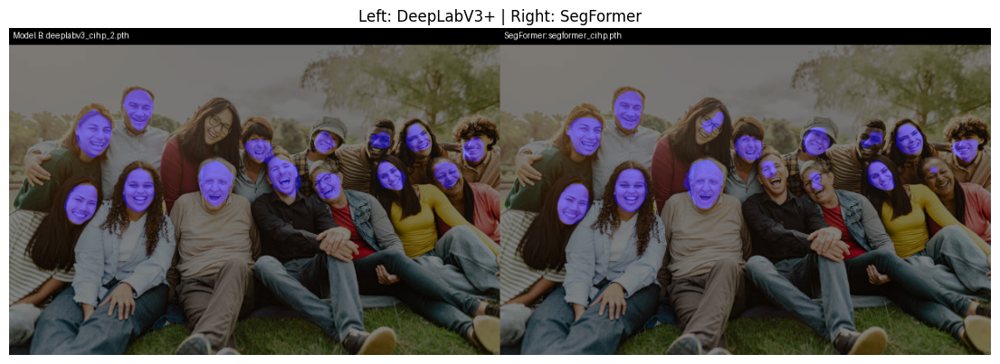

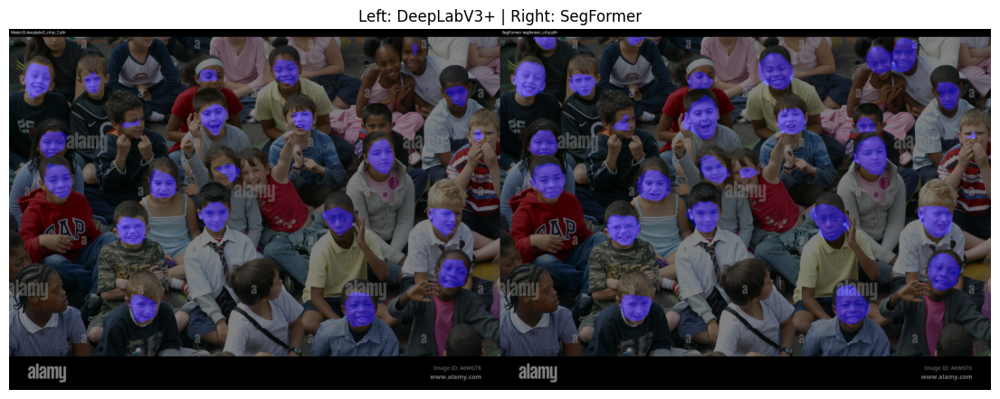

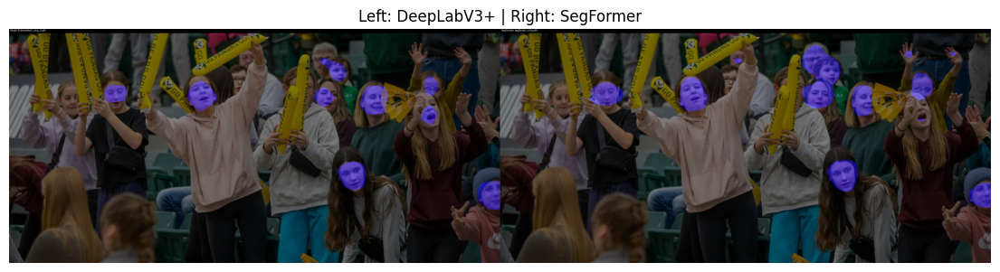

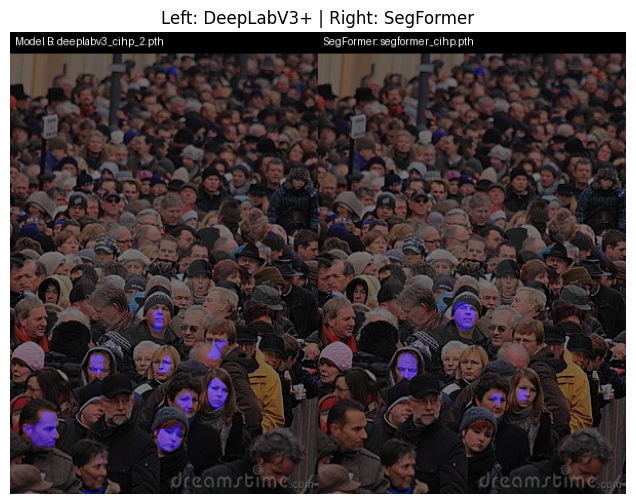

In [28]:
from transformers import SegformerForSemanticSegmentation, SegformerImageProcessor
import torchvision.transforms as T
import cv2
import numpy as np
import torch
from torchvision import models
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import torch.nn.functional as F

# --- Config ---
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
NUM_CLASSES = 3
IMG_SIZE = (512, 512)
FACE_CLASS = 1
ALPHA = 0.5

# --- Load Model B ---
def load_model(path):
    model = models.segmentation.deeplabv3_mobilenet_v3_large(pretrained=False)
    model.classifier[4] = torch.nn.Conv2d(256, NUM_CLASSES, kernel_size=1)
    model.load_state_dict(torch.load(path, map_location=DEVICE))
    model.to(DEVICE).eval()
    return model

model_B = load_model('deeplabv3_cihp_2.pth')

# --- Preprocess ---
def preprocess_image(img_path):
    image = Image.open(img_path).convert('RGB')
    original_size = image.size
    image_resized = image.resize(IMG_SIZE, Image.BILINEAR)
    tensor = T.ToTensor()(image_resized).unsqueeze(0).to(DEVICE)
    return tensor, original_size, np.array(image)

# --- Predict ---
def predict_mask(model, tensor, original_size):
    with torch.no_grad():
        out = model(tensor)['out']
        logits = F.interpolate(out, size=original_size[::-1], mode='bilinear', align_corners=False)
        predicted = torch.argmax(logits, dim=1).squeeze(0).cpu().numpy()
    return predicted

# --- Overlay mask with 50% alpha ---
def overlay_mask(image_np, mask, face_class=FACE_CLASS, color=(0, 0, 255)):
    mask_bool = (mask == face_class)
    mask_rgb = np.zeros_like(image_np)
    mask_rgb[mask_bool] = color
    overlay = cv2.addWeighted(image_np, 1 - ALPHA, mask_rgb, ALPHA, 0)
    return overlay

# --- Draw caption ---
def draw_caption(img_np, text):
    img = Image.fromarray(img_np)
    draw = ImageDraw.Draw(img)
    font = ImageFont.load_default()
    draw.rectangle([0, 0, img.size[0], 20], fill=(0, 0, 0, 128))
    draw.text((5, 3), text, fill=(255, 255, 255), font=font)
    return np.array(img)

# --- Show result ---
def show_model_B_output(img_path):
    tensor, original_size, orig_image = preprocess_image(img_path)
    mask_B = predict_mask(model_B, tensor, original_size)
    overlay_B = overlay_mask(orig_image, mask_B)
    overlay_B = draw_caption(overlay_B, "Model B: deeplabv3_cihp_2.pth")

    plt.figure(figsize=(8, 6))
    plt.imshow(overlay_B)
    plt.axis('off')
    plt.title("Model B Output")
    plt.show()


# --- Load SegFormer ---
processor = SegformerImageProcessor(do_resize=True, size=IMG_SIZE, reduce_labels=False)
config = SegformerConfig(
    num_labels=3,
    id2label={0: "background", 1: "face", 2: "hat"},
    label2id={"background": 0, "face": 1, "hat": 2}
)

# Initialize model with matching config
segformer = SegformerForSemanticSegmentation(config)
segformer.load_state_dict(torch.load("segformer_cihp.pth", map_location=DEVICE))
segformer = segformer.to(DEVICE)

# --- Predict with SegFormer ---
def predict_mask_segformer(model, processor, image_pil):
    original_size = image_pil.size  # (width, height)
    inputs = processor(images=image_pil, return_tensors="pt").to(DEVICE)
    
    with torch.no_grad():
        outputs = model(**inputs)
    
    logits = outputs.logits  # shape: [1, C, H, W]
    
    # Resize prediction back to original resolution
    upsampled_logits = F.interpolate(logits, size=original_size[::-1], mode='bilinear', align_corners=False)
    pred_mask = torch.argmax(upsampled_logits, dim=1).squeeze(0).cpu().numpy()
    return pred_mask


# --- Combined display ---
def show_both_models_output(img_path):
    # Original image + preprocessed version
    tensor, original_size, orig_image = preprocess_image(img_path)
    image_pil = Image.open(img_path).convert("RGB")

    # --- Model B (DeepLabV3+) ---
    mask_B = predict_mask(model_B, tensor, original_size)
    overlay_B = overlay_mask(orig_image, mask_B)
    overlay_B = draw_caption(overlay_B, "Model B: deeplabv3_cihp_2.pth")

    # --- SegFormer ---
    mask_S = predict_mask_segformer(segformer, processor, image_pil)
    overlay_S = overlay_mask(orig_image, mask_S)
    overlay_S = draw_caption(overlay_S, "SegFormer: segformer_cihp.pth")

    # --- Combine and show ---
    combined = np.hstack((overlay_B, overlay_S))
    plt.figure(figsize=(14, 6))
    plt.imshow(combined)
    plt.axis("off")
    plt.title("Left: DeepLabV3+ | Right: SegFormer")
    plt.show()

# --- Run on image paths ---
image_paths = [
    'istockphoto-1480574526-612x612.jpg',
    'crowd-of-primary-school-children-in-the-school-playground-A6WGT8.jpg',
    'convert.webp',
    'cd097ca3e6a09fa9d231f10b549d14b9.jpg'
]

for path in image_paths:
    show_both_models_output(path)


C:\Users\alexi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\alexi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
C:\Users\alexi\AppData\Local\Temp\ipykernel_11844\2616606647.py:21: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary 

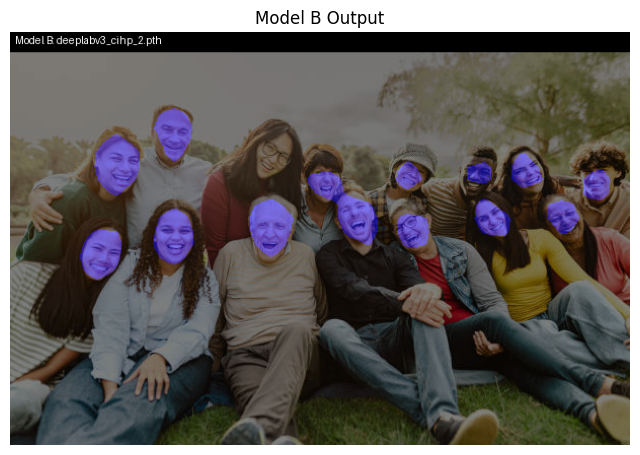

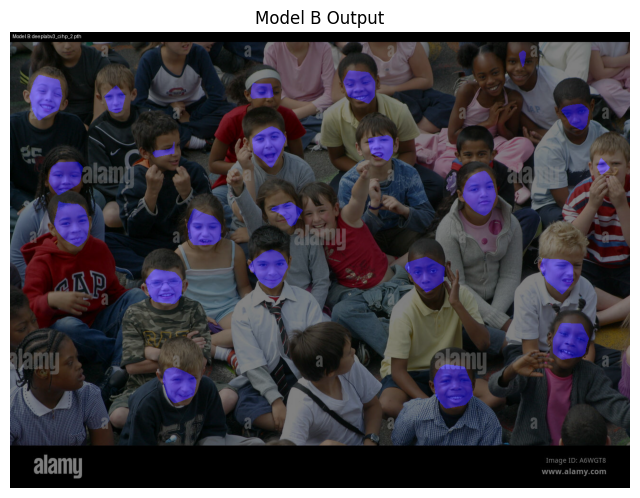

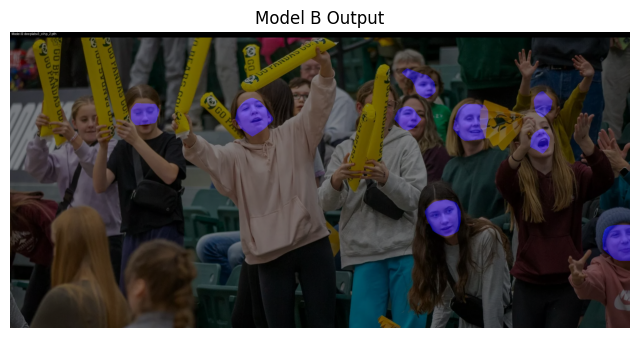

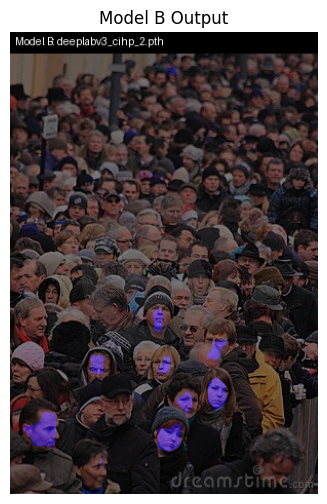

In [ ]:
import cv2
import numpy as np
import torch
import torch.nn.functional as F
from torchvision import models
from PIL import Image, ImageDraw, ImageFont
import torchvision.transforms as T
import matplotlib.pyplot as plt

# --- Config ---
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
NUM_CLASSES = 3
IMG_SIZE = (512, 512)
FACE_CLASS = 1
ALPHA = 0.5

# --- Load Model B ---
def load_model(path):
    model = models.segmentation.deeplabv3_mobilenet_v3_large(pretrained=False)
    model.classifier[4] = torch.nn.Conv2d(256, NUM_CLASSES, kernel_size=1)
    model.load_state_dict(torch.load(path, map_location=DEVICE))
    model.to(DEVICE).eval()
    return model

model_B = load_model('deeplabv3_cihp_2.pth')

# --- Preprocess ---
def preprocess_image(img_path):
    image = Image.open(img_path).convert('RGB')
    original_size = image.size
    image_resized = image.resize(IMG_SIZE, Image.BILINEAR)
    tensor = T.ToTensor()(image_resized).unsqueeze(0).to(DEVICE)
    return tensor, original_size, np.array(image)

# --- Predict ---
def predict_mask(model, tensor, original_size):
    with torch.no_grad():
        out = model(tensor)['out']
        logits = F.interpolate(out, size=original_size[::-1], mode='bilinear', align_corners=False)
        predicted = torch.argmax(logits, dim=1).squeeze(0).cpu().numpy()
    return predicted

# --- Overlay mask with 50% alpha ---
def overlay_mask(image_np, mask, face_class=FACE_CLASS, color=(0, 0, 255)):
    mask_bool = (mask == face_class)
    mask_rgb = np.zeros_like(image_np)
    mask_rgb[mask_bool] = color
    overlay = cv2.addWeighted(image_np, 1 - ALPHA, mask_rgb, ALPHA, 0)
    return overlay

# --- Draw caption ---
def draw_caption(img_np, text):
    img = Image.fromarray(img_np)
    draw = ImageDraw.Draw(img)
    font = ImageFont.load_default()
    draw.rectangle([0, 0, img.size[0], 20], fill=(0, 0, 0, 128))
    draw.text((5, 3), text, fill=(255, 255, 255), font=font)
    return np.array(img)

# --- Show result ---
def show_model_B_output(img_path):
    tensor, original_size, orig_image = preprocess_image(img_path)
    mask_B = predict_mask(model_B, tensor, original_size)
    overlay_B = overlay_mask(orig_image, mask_B)
    overlay_B = draw_caption(overlay_B, "Model B: deeplabv3_cihp_2.pth")

    plt.figure(figsize=(8, 6))
    plt.imshow(overlay_B)
    plt.axis('off')
    plt.title("Model B Output")
    plt.show()

# --- Run on image paths ---
image_paths = [
    'istockphoto-1480574526-612x612.jpg',
    'crowd-of-primary-school-children-in-the-school-playground-A6WGT8.jpg',
    'convert.webp',
    'cd097ca3e6a09fa9d231f10b549d14b9.jpg'
]

for path in image_paths:
    show_model_B_output(path)


C:\Users\alexi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\alexi\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
C:\Users\alexi\AppData\Local\Temp\ipykernel_11844\426619007.py:60: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary c

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


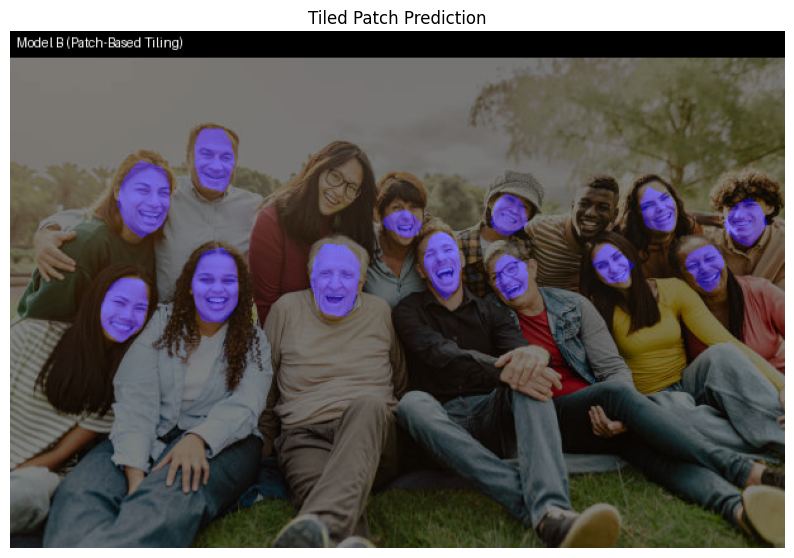

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


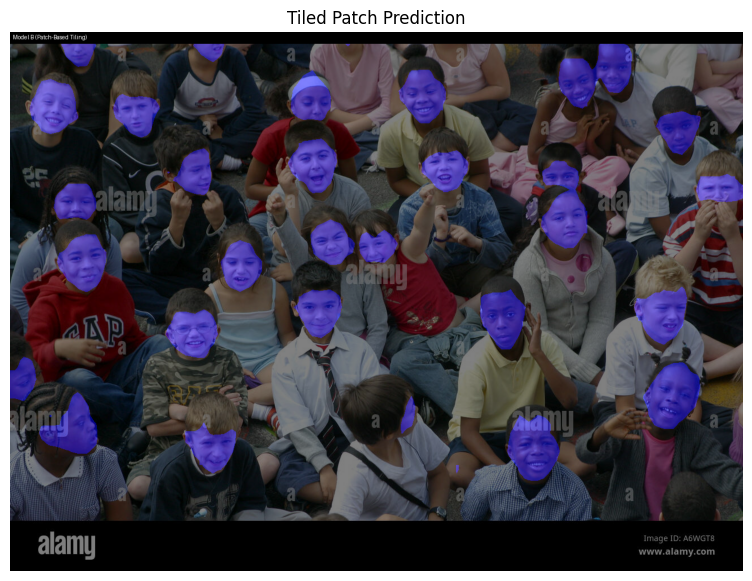

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


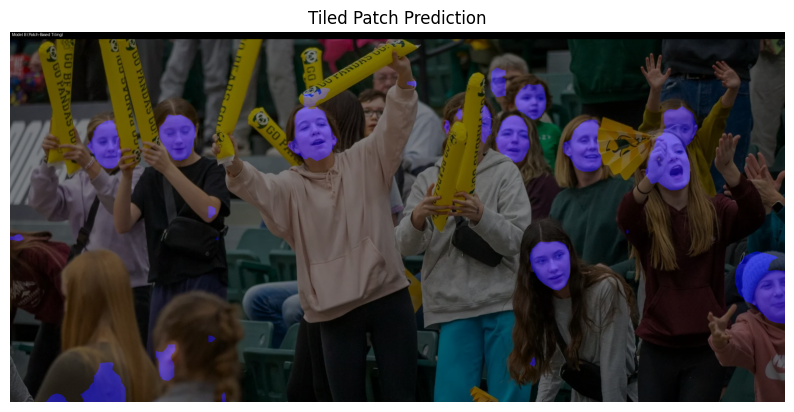

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


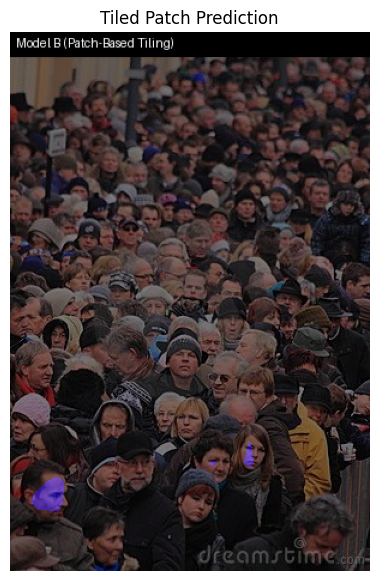

In [17]:
def patchwise_predict(model, image_np, tile_size=512, stride=256, face_class=1):
    h, w, _ = image_np.shape
    full_mask = np.zeros((h, w), dtype=np.uint8)

    transform = T.Compose([
        T.Resize((tile_size, tile_size)),
        T.ToTensor()
    ])

    for y in range(0, h, stride):
        for x in range(0, w, stride):
            # Extract tile
            x_end = min(x + tile_size, w)
            y_end = min(y + tile_size, h)
            tile = image_np[y:y_end, x:x_end]
            
            # Pad if necessary
            pad_right = tile_size - (x_end - x)
            pad_bottom = tile_size - (y_end - y)
            tile_padded = cv2.copyMakeBorder(tile, 0, pad_bottom, 0, pad_right, cv2.BORDER_REFLECT)

            # Predict
            image_tensor = transform(Image.fromarray(tile_padded)).unsqueeze(0).to(DEVICE)
            with torch.no_grad():
                out = model(image_tensor)['out']
                logits = F.interpolate(out, size=(tile_size, tile_size), mode='bilinear', align_corners=False)
                pred_mask = torch.argmax(logits, dim=1).squeeze(0).cpu().numpy()

            # Crop padding and place prediction
            pred_mask = pred_mask[:y_end - y, :x_end - x]
            full_mask[y:y_end, x:x_end] = np.maximum(full_mask[y:y_end, x:x_end], (pred_mask == face_class).astype(np.uint8))

    return full_mask

def preprocess_image(img_path):
    image = Image.open(img_path).convert('RGB')
    original_size = image.size
    image_resized = image.resize(IMG_SIZE, Image.BILINEAR)
    tensor = T.ToTensor()(image_resized).unsqueeze(0).to(DEVICE)
    return tensor, original_size, np.array(image)

def show_tiled_prediction(image_path):
    image = Image.open(image_path).convert('RGB')
    image_np = np.array(image)
    mask = patchwise_predict(model_B, image_np, tile_size=512, stride=256, face_class=1)

    # Overlay
    overlay = overlay_mask(image_np, mask, face_class=1, color=(0, 0, 255))
    overlay = draw_caption(overlay, "Model B (Patch-Based Tiling)")

    plt.figure(figsize=(10, 7))
    plt.imshow(overlay)
    plt.axis('off')
    plt.title("Tiled Patch Prediction")
    plt.show()

def load_model(path):
    model = models.segmentation.deeplabv3_mobilenet_v3_large(pretrained=False)
    model.classifier[4] = torch.nn.Conv2d(256, NUM_CLASSES, kernel_size=1)
    model.load_state_dict(torch.load(path, map_location=DEVICE))
    model.to(DEVICE).eval()
    return model

model_B = load_model('deeplabv3_cihp_2.pth')

image_paths = [
    'istockphoto-1480574526-612x612.jpg',
    'crowd-of-primary-school-children-in-the-school-playground-A6WGT8.jpg',
    'convert.webp',
    'cd097ca3e6a09fa9d231f10b549d14b9.jpg'
]

for path in image_paths:
    image = preprocess_image(path)[2]
    result = patchwise_predict(model=model_B, image_np=image)
    print(result)
    show_tiled_prediction(path)




In [13]:
image, _ = dataset[1]  # Already resized & tensorized
input_tensor = image.unsqueeze(0).to(DEVICE)  # Add batch dim
original_size = (image.shape[2], image.shape[1])  # (W, H) from tensor shape

mask = predict_mask(model, input_tensor, original_size)
num_faces = count_faces(mask)

print(f"Detected {num_faces} face(s).")


Detected 4 face(s).
